# The Midwest underwater

A look at 2019 floods in South Dakota, USA

Elsa Culler  
Nate Quarderer  
2025-05-20

## Set up

To get started on this notebook, you’ll need to restore any variables
from previous notebooks to your workspace.

In [1]:
%store -r

# Import libraries
import pandas as pd # work with tabular data
import geopandas as gpd # work with vector spatial data
import hvplot.pandas # to make interactive plot

## STEP 1: Site Description and Map

In our example analysis, we’ll be focusing on the Cheyenne River, which
flows into Lake Oahu by looking at a stream gage near Wasta, SD, USA.
After we’ve completed this example analysis, we suggest that you look
into another flood – perhaps one that you have a personal connection to.

### Site Description

<link rel="stylesheet" type="text/css" href="./assets/styles.css"><div class="callout callout-style-default callout-titled callout-task"><div class="callout-header"><div class="callout-icon-container"><i class="callout-icon"></i></div><div class="callout-title-container flex-fill">Try It</div></div><div class="callout-body-container callout-body"><p>Describe the Cheyenne River area in a few sentences. You can
include:</p>
<ul>
<li>Information about the <strong>climatology</strong> of the area, or
typical precipitation and temperature at different months of the
year</li>
<li>The <strong>runoff ratio</strong> (average annual runoff divided by
average annual precipitation)</li>
<li>Which <strong>wildlife and ecosystems</strong> exist in the
area</li>
<li>What <strong>communities and infrastructure</strong> are in the
area</li>
</ul></div></div>

YOUR SITE DESCRIPTION HERE

### Site Map: The Cheyenne River near Wasta

The code below will create an interactive map of the area. But something
is wrong - no one defined the latitude and longitude as **variables**.
Try running the code to see what happens when you reference a variable
name that doesn’t exist!

<link rel="stylesheet" type="text/css" href="./assets/styles.css"><div class="callout callout-style-default callout-titled callout-task"><div class="callout-header"><div class="callout-icon-container"><i class="callout-icon"></i></div><div class="callout-title-container flex-fill">Try It</div></div><div class="callout-body-container callout-body"><p>Find the location of the Cheyenne River near Wasta <strong>USGS
stream gauge</strong> using the <a
href="https://waterdata.usgs.gov/nwis?">National Water Information
System</a>. This is not the easiest thing to find if you aren’t used to
NWIS, so we’ve provided some screenshots of the process below.</p></div></div>

##### Step 1: NWIS Mapper

<figure>
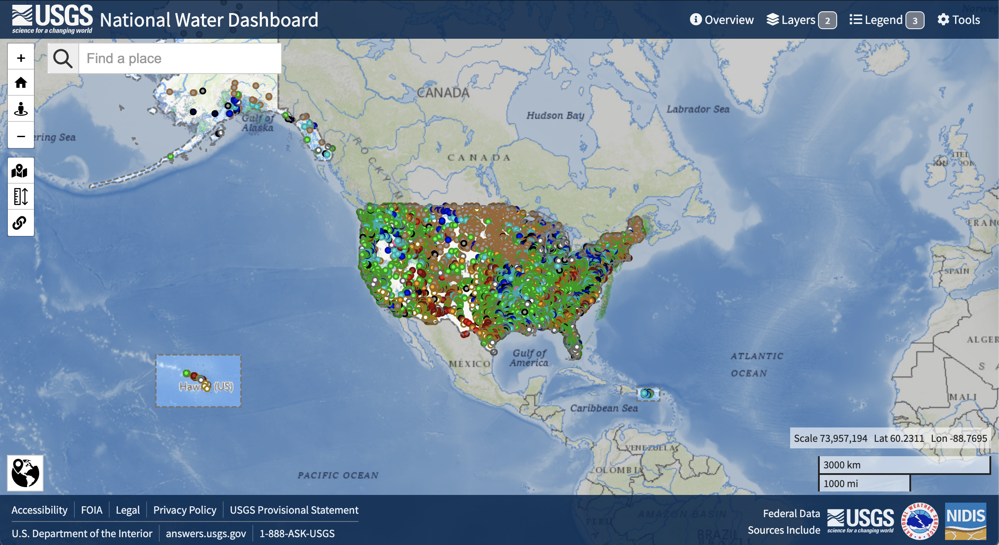
<figcaption aria-hidden="true">Go to the <a
href="https://dashboard.waterdata.usgs.gov/app/nwd/en/">National Water
Information System Mapper</a></figcaption>
</figure>

##### Step 2: Search

<figure>
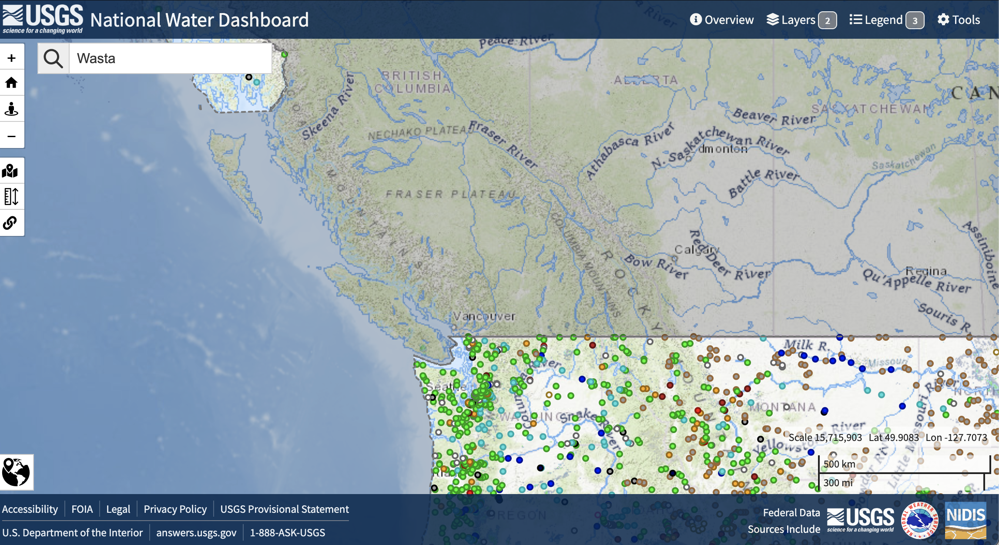
<figcaption aria-hidden="true">Type in <code>Wasta</code> in the
<code>Find a Place</code> box</figcaption>
</figure>

##### Step 3: Select gage

<figure>
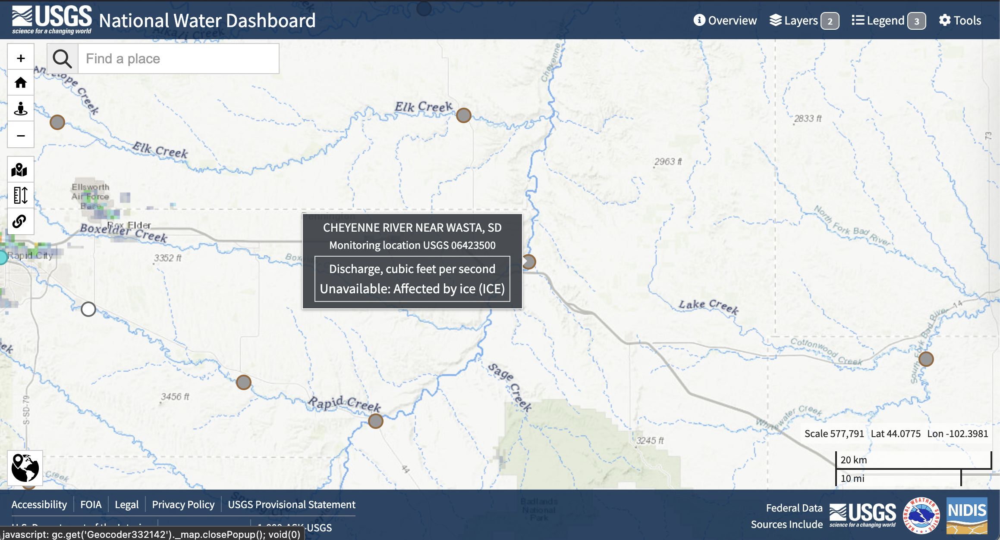
<figcaption aria-hidden="true">Click on the Cheyenne River near Wasta
site. It should open a new window.</figcaption>
</figure>

##### Step 4: Open site page

<figure>
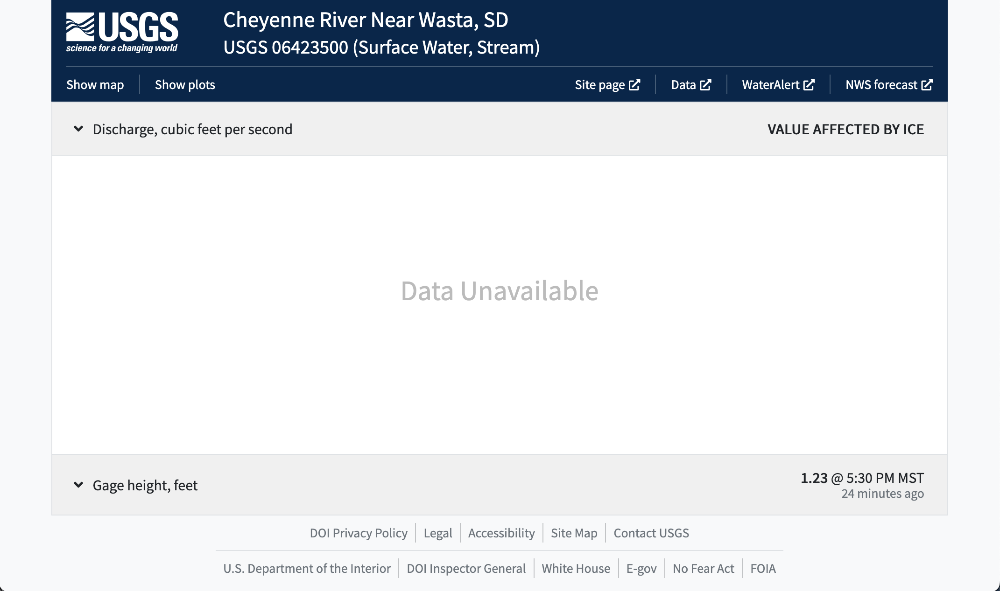
<figcaption aria-hidden="true">Click on <code>Site page</code> at the
top</figcaption>
</figure>

<figure>
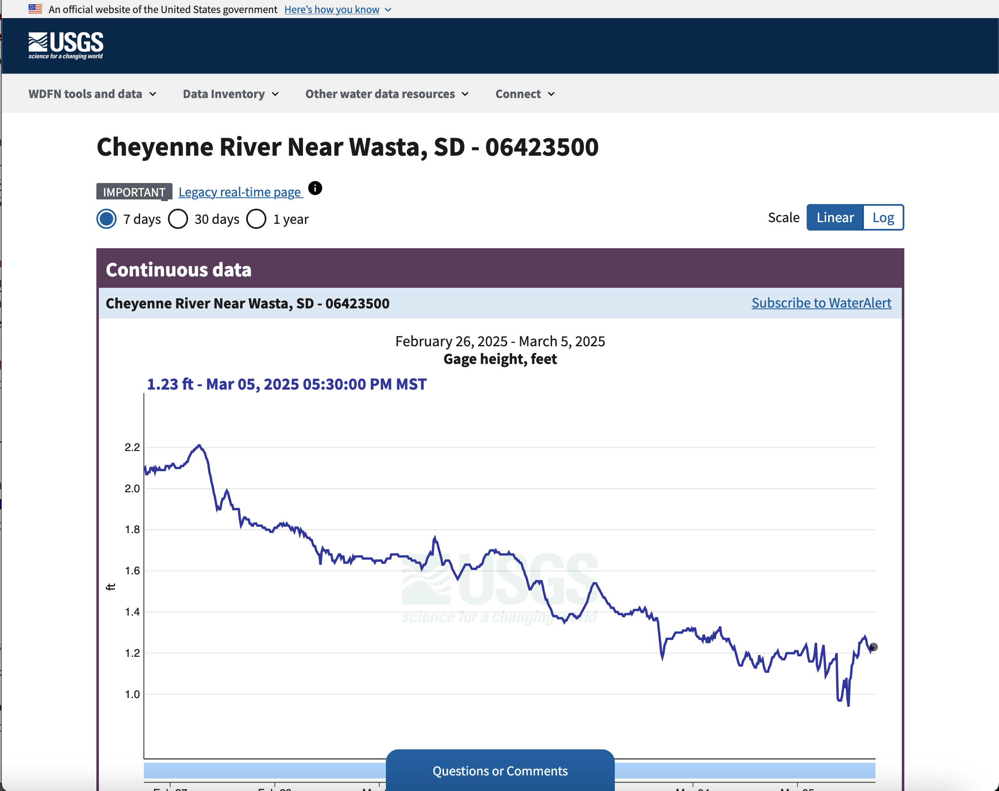
<figcaption aria-hidden="true">You should now be on the Cheyenne River
near Wasta gage site page</figcaption>
</figure>

##### Step 5: Get coordinates

<figure>
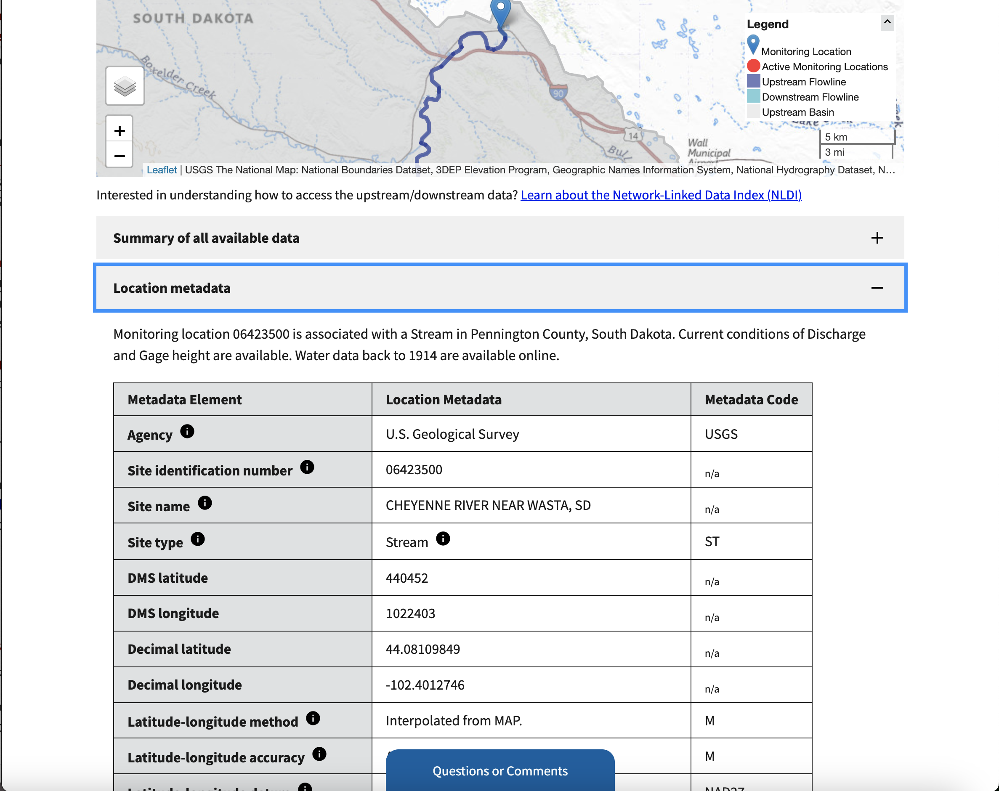
<figcaption aria-hidden="true">Scroll to the bottom and open the
<code>Location metadata</code> section. Make a note of the decimal
latitude and longitude!</figcaption>
</figure>

<link rel="stylesheet" type="text/css" href="./assets/styles.css"><div class="callout callout-style-default callout-titled callout-task"><div class="callout-header"><div class="callout-icon-container"><i class="callout-icon"></i></div><div class="callout-title-container flex-fill">Try It</div></div><div class="callout-body-container callout-body"><p>Now, you’re ready to create your site map!</p>
<ol type="1">
<li>Define latitude and longitude variables to <strong>match the
variable names used in the code</strong>.</li>
<li>Rename the variable <code>gdf</code> with something
<strong>descriptive</strong> wherever it occurs.</li>
<li>Run and test your cell to make sure everything works.</li>
</ol></div></div>

<link rel="stylesheet" type="text/css" href="./assets/styles.css"><div class="callout callout-style-default callout-titled callout-extra"><div class="callout-header"><div class="callout-icon-container"><i class="callout-icon"></i></div><div class="callout-title-container flex-fill">Looking for an Extra Challenge?</div></div><div class="callout-body-container callout-body"><p>Customize your plot <a
href="https://hvplot.holoviz.org/index.html">using the hvplot
documentation</a> or by asking your favorite AI tool. For example, you
could:</p>
<ul>
<li>Change the size of your map</li>
<li>Change the base map images</li>
<li>Change the color and size of your place marker</li>
<li>Remove the axis labels for a cleaner map</li>
</ul></div></div>

In [2]:
# Create a GeoDataFrame with the gage location
gage_lon = -102.40127
gage_lat = 44.08109

cheyenne_river_gdf = gpd.GeoDataFrame(
    # Create the geometry from lat/lon
    geometry=gpd.points_from_xy([gage_lon], [gage_lat]),
    # Coordinate Reference System for lat/lon values
    crs="EPSG:4326"
)

# Plot using hvPlot with a basemap
buffer = 0.01
cheyenne_river_gdf.hvplot.points(
    # Use web tile basemap imagery
    geo=True, tiles='EsriImagery', 
    # Set approximate bounding box
    ylim=(gage_lat-buffer, gage_lat+buffer),
    xlim=(gage_lon-buffer, gage_lon+buffer),
)

:Overlay
   .WMTS.I   :WMTS   [Longitude,Latitude]
   .Points.I :Points   [Longitude,Latitude]

## Wrap up

Don’t forget to store your variables so you can use them in other
notebooks! This code will store all your variables. You might want to
specify specific variables, especially if you have large objects in
memory that you won’t need in the future.

In [3]:
%store 

Stored variables and their in-db values:
project             -> <earthpy.project.Project object at 0x7a8d7e3754d0>


Finally, be sure to `Restart` and `Run all` to make sure your notebook
works all the way through!